In [1]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px

In [21]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Reviews.csv')


In [3]:
df = df[df['Score'] != 3]
df['sentiment'] = df['Score'].apply(lambda rating : +1 if rating > 3 else -1)

In [4]:
pos_df = df[df['sentiment'] == 1]
neg_df = df[df['sentiment'] == -1]
df[['Text','Score','sentiment']].tail(2)

,Text,Score,sentiment
568452,These are the BEST treats for training and rew...,5,1
568453,"I am very satisfied ,product is as advertised,...",5,1


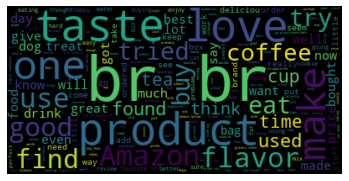

In [5]:
text_block = " ".join(review for review in df.Text)
wordcloud = WordCloud().generate(text_block)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud_tweets.png')
plt.show()

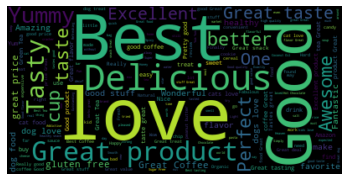

In [6]:
positive_summary = " ".join(x for x in pos_df.Summary)
wordcloud_positive = WordCloud().generate(positive_summary)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.axis("off")
plt.savefig('positive_summary_word_cloud.png')
plt.show()

In [7]:
df['sentimentt'] = df['sentiment'].replace({-1 : 'negative'})
df['sentimentt'] = df['sentimentt'].replace({1 : 'positive'})
fig = px.histogram(df, x="sentimentt")
fig.update_traces(marker_color="indianred",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Sentiment')
fig.show()

In [27]:
def punc_remove(text):
    x = "".join(i for i in text if i not in ("?", ".", ";", ":",  "!",'"'))
    return x
df['Text'] = df['Text'].apply(remove_punctuation)
df = df.dropna(subset=['Summary'])
df['Summary'] = df['Summary'].apply(punc_remove)

In [ ]:
index = df.index
df['y'] = np.random.randn(len(index))
train = df[df['y'] <= 0.8]
test = df[df['y'] > 0.8]

In [37]:
dfNew = df[['Summary','sentiment']]
dfNew.tail(1)

,Summary,sentiment
568453,Great Honey,1


In [30]:
from sklearn.feature_extraction.text import CountVectorizer
vectors = CountVectorizer(token_pattern=r'\b\w+\b')
train_set = vectors.fit_transform(train['Summary'])
test_set = vectors.transform(test['Summary'])

In [31]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

In [32]:
X_train = train_set
X_test = test_set
y_train = train['sentiment']
y_test = test['sentiment']


In [33]:
lr.fit(X_train,y_train)

LogisticRegression()

In [34]:
predictions = lr.predict(X_test)

In [35]:
from sklearn.metrics import confusion_matrix,classification_report
new = np.asarray(y_test)
confusion_matrix(predictions,y_test)

array([[11597,  2402],
       [ 5741, 91933]])

In [36]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

          -1       0.67      0.83      0.74     13999
           1       0.97      0.94      0.96     97674

    accuracy                           0.93    111673
   macro avg       0.82      0.88      0.85    111673
weighted avg       0.94      0.93      0.93    111673

